<div style="border: 2px solid #FF69B4; background-color: #000000; color: white; padding: 20px; border-radius: 5px;">

# Figure 5

Plots of extreme events comparison

---

##### Heavy Precipitation
- **Boris Storm** *(2024/09/[12-16])*

##### Heat wave
- **European Heatwave** *(2019)*

</div>

In [1]:
import numpy as np
import pandas as pd
import xarray as xr
import regionmask

import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [2]:
def plot_custom_maps(data_list, options_list, rows=1, cols=1, lat_start=-90, lat_end=90, lon_start=-180, lon_end=180, plot_type='contour',
                     common_colorbar=None, cmcbpos=0.2, triend=None, lbl_size=12, clvl=31,
                     fig_title=None, mntpos=None, mntitle_size=None, num_Vpos=0.98, num_Hpos=0.02, num_siz=15,
                     fsize=(10, 10), projection=ccrs.NorthPolarStereo()):
    """
    Create maps with customizable subplots and options.

    Parameters:
    - data_list (list): A list of data arrays to be plotted in each subplot.
    - options_list (list, optional): A list of dictionaries containing options for each subplot. Each dictionary
      may include 'title', 'vmin', 'vmax', 'clrmap', 'lbl', and other subplot-specific settings.
    - rows (int, optional): Number of rows in the subplot grid (default: 1).
    - cols (int, optional): Number of columns in the subplot grid (default: 1).
    - lat_start (int, optional): The starting latitude for the map (default: 60).
    - lat_end (int, optional): The ending latitude for the map (default: 90).
    - plot_type (str, optional): Type of plot ('contour', 'pmesh', or 'imshow') (default: 'contour').
    - common_colorbar (bool, optional): Whether to use a common colorbar for all subplots (default: None).
    - cmcbpos (float, optional): Vertical position of the common colorbar (default: 0.2).
    - triend (str, optional): Colorbar extend option ('neither', 'both', 'min', 'max') (default: None).
    - lbl_size (int, optional): Font size for subplot labels (default: 12).
    - fig_title (str, optional): Main figure title (default: None).
    - mntpos (float, optional): Vertical position of the main figure title (default: None).
    - mntitle_size (int, optional): Font size for the main figure title (default: None).
    - num_Vpos (float, optional): Panel number vertical position.
    - num_Hpos (float, optional): Panel number horizontal position.
    - num_siz (int, optional): Panel number font_size.
    - fsize (tuple, optional): Size of the entire figure in inches (default: (10, 10)).
    - projection (cartopy.crs.Projection, optional): The map projection for the plots (default: ccrs.NorthPolarStereo()).

    Returns:
    - fig (matplotlib.figure.Figure): The Matplotlib figure object.
    - axs (list of matplotlib.axes.Axes): A list of Matplotlib axes objects for each subplot.
    """

    if plot_type not in ('contour', 'pmesh', 'imshow'):
        raise ValueError("Invalid plot_type. Use 'contour', 'pmesh', or 'imshow'.")

    num_subplots = len(data_list)

    # Ensure data_list and options_list have the same length
    if options_list is not None:
        if len(options_list) != num_subplots:
            raise ValueError("Length of options_list must match the number of subplots.")

    fig, axs = plt.subplots(rows, cols, figsize=fsize, subplot_kw={"projection": projection}, constrained_layout=False)

    if rows == 1 and cols == 1:
        axs = np.array([[axs]])  

    plot_functions = {
        'contour': lambda data, ax, options: ax.contourf(data.lon, data.lat, data, transform=ccrs.PlateCarree(),
                                                         levels=np.linspace(options['vmin'], options['vmax'], clvl),
                                                         cmap=options['clrmap']),
        'pmesh': lambda data, ax, options: ax.pcolormesh(data.lon, data.lat, data, transform=ccrs.PlateCarree(),
                                                        vmin=options['vmin'], vmax=options['vmax'], cmap=options['clrmap']),
    }

    for i, (ax, data) in enumerate(zip(axs.flatten(), data_list)):
        if data is not None:
            ax.set_extent([lon_start, lon_end, lat_start, lat_end], crs=ccrs.PlateCarree())

            if isinstance(projection, ccrs.NorthPolarStereo):
                theta = np.linspace(0, 2 * np.pi, 100)
                center, radius = [0.5, 0.5], 0.5
                verts = np.vstack([np.sin(theta), np.cos(theta)]).T
                circle = mpl.path.Path(verts * radius + center)
                ax.set_boundary(circle, transform=ax.transAxes)

            pcm = plot_functions[plot_type](data, ax, options_list[i])
            # ax.title.set_text(options_list[i]['title'])
            ax.title.set_fontsize(18)
            
            ax.coastlines(linewidth=0.25)
            gl = ax.gridlines(draw_labels=False, linewidth=0.5, color='k', alpha=0.2, linestyle='--', zorder=10)
            gl.ylabels_left = True  # Show y-axis labels on the left side
            gl.xlabels_bottom = True

            gl.ylabel_style = {'size': 16}  
            gl.xlabel_style = {'size': 16}

            options = options_list[i]
            if not common_colorbar:
                cbar = fig.colorbar(pcm, ax=ax, shrink=0.75, pad=0.04, orientation='horizontal', extend=triend, aspect=40)
                cbar.ax.xaxis.set_label_coords(0.5, 1.0 + 1 / 100.0)
                cbar.ax.set_title(options.get('lbl', ''), fontsize=lbl_size)
                cbar.ax.yaxis.set_tick_params(width=0.1) 
                cbar.ax.tick_params(labelsize=18)

            # Add panel label
            panel_label = options.get('panel_label', f'{chr(97 + i)})')

            # panel_label = options.get('panel_label', f"{chr(97 + i)}) {options_list[i]['title']}")
            ax.text(num_Hpos, num_Vpos, panel_label, transform=ax.transAxes, fontsize=num_siz, va='top', ha='left')

        else:
            fig.delaxes(ax)  # Remove the subplot if data is None

    if common_colorbar:
        cbar_ax = fig.add_axes([0.15, cmcbpos, 0.7, 0.02])
        cbar = fig.colorbar(pcm, cax=cbar_ax, orientation='horizontal', extend=triend)
        cbar.ax.set_title(options_list[0].get('lbl', ''), fontsize=lbl_size)
        cbar.ax.yaxis.set_tick_params(width=0.1) 
        cbar.ax.tick_params(labelsize=22)
        
    if fig_title:
        plt.suptitle(fig_title, fontsize=mntitle_size, y=mntpos)

    # Use tight_layout to minimize whitespace
    plt.tight_layout()
    
    return fig, axs


In [4]:
def create_custom_colormap(colormap_file, reverse=False):
    """
    Create a custom colormap from an NCL colormap file.

    Parameters:
    - colormap_file (str): Path to the NCL colormap file.
    - reverse (bool): If True, reverse the colormap.

    Returns:
    - custom_cmap (LinearSegmentedColormap): Custom colormap object.
    """
    # Read the RGB values from the NCL colormap file
    rgb_values = np.loadtxt(colormap_file)

    # Find the largest digit in the file
    max_digit = np.max(rgb_values)

    # Scale RGB values by the largest digit
    rgb_values_scaled = rgb_values / max_digit

    # Optionally reverse the colormap
    if reverse:
        rgb_values_scaled = rgb_values_scaled[::-1]

    # Create the colormap
    custom_cmap = LinearSegmentedColormap.from_list("CustomColormap", rgb_values_scaled)

    return custom_cmap

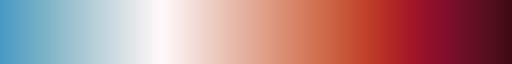

In [5]:
ncl_colormap_file = "/work/ab0995/a270229/work/misc/NCL_colortables/cmocean_balance_70bluereds.rgb"
custom_cmap = create_custom_colormap(ncl_colormap_file,reverse=False)
custom_cmap

<div style="border: 2px solid #00ff40; background-color: #000000; color: white; padding: 20px; border-radius: 5px;">

Heat wave

---
- **European Heatwave** *(2019/07/25)*
  
</div>

In [6]:
rpath    = '/work/ab0995/a270229/work/data/paper1/story-nudged/data/events/HW/'
plotpath = '/work/ab0995/a270229/work/data/paper1/story-nudged/plot/hires/'

In [7]:
dsE = xr.open_dataset(f"{rpath}ERA5/2t_max_daily_20190725_R-tco1279_EUR.nc")
dsM = xr.open_dataset(f"{rpath}hist/2t_max_daily_20190725_R-tco1279_EUR.nc")
dsA = xr.open_dataset(f"{rpath}AWI-CM1/2t_max_daily_20190725_R-tco1279_EUR.nc")
dsO = xr.open_dataset(f"{rpath}EOBS/2t_max_daily_20190725_R-tco1279_EUR.nc")

In [8]:
dst = '2019-07-25'
edt = '2019-07-25'

daE = dsE['2t'].isel(time=0)-273.15
daM = dsM['2t'].isel(time=0,height=0)-273.15
daA = dsA['temp2'].isel(time=0)-273.15
daO = dsO['tx'].isel(time=0)

In [9]:
landmsk = regionmask.defined_regions.natural_earth_v5_0_0.land_10.mask(daM.lon, daM.lat)

In [10]:
daE_m = xr.where(np.isnan(landmsk),np.nan,daE)
daM_m = xr.where(np.isnan(landmsk),np.nan,daM)
daA_m = xr.where(np.isnan(landmsk),np.nan,daA)
daO_m = xr.where(np.isnan(landmsk),np.nan,daO)

/home/a/a270229/.conda/envs/mypython/lib/python3.10/site-packages/cartopy/mpl/gridliner.py:475: UserWarning: The .ylabels_left attribute is deprecated. Please use .left_labels to toggle visibility instead.
  warnings.warn('The .ylabels_left attribute is deprecated. Please '
/home/a/a270229/.conda/envs/mypython/lib/python3.10/site-packages/cartopy/mpl/gridliner.py:463: UserWarning: The .xlabels_bottom attribute is deprecated. Please use .bottom_labels to toggle visibility instead.
  warnings.warn('The .xlabels_bottom attribute is deprecated. Please '
/home/a/a270229/.conda/envs/mypython/lib/python3.10/site-packages/cartopy/mpl/gridliner.py:475: UserWarning: The .ylabels_left attribute is deprecated. Please use .left_labels to toggle visibility instead.
  warnings.warn('The .ylabels_left attribute is deprecated. Please '
/home/a/a270229/.conda/envs/mypython/lib/python3.10/site-packages/cartopy/mpl/gridliner.py:463: UserWarning: The .xlabels_bottom attribute is deprecated. Please use .bot

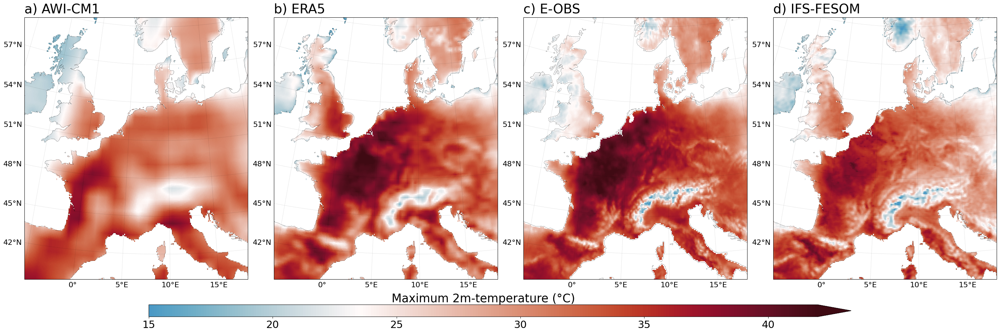

In [11]:
# ncl_colormap_file = "/work/ab0995/a270229/work/misc/NCL_colortables/cmocean_balance.rgb"
# cmap = create_custom_colormap(ncl_colormap_file,reverse=False)
# custom_cmap

# cmap = 'afmhot_r'
cmap = custom_cmap #cmap_c
vmin=15
vmax=42

data_list = [daA_m, daE_m, daO_m, daM_m]

# Custom options for each subplot
options_list = [

    {'title': 'AWI-CM1', 
     'vmin': vmin, 
     'vmax': vmax, 
     'clrmap': cmap, 'lbl': 'Maximum 2m-temperature (°C)',
     'panel_label': 'a) AWI-CM1'},
    
    {'title': 'ERA5',
     'vmin': vmin, 
     'vmax': vmax,
     'clrmap': cmap, 'lbl': 'Maximum 2m-temperature (°C)',
     'panel_label': 'b) ERA5'},

     {'title': 'E-OBS', 
     'vmin': vmin, 
     'vmax': vmax, 
     'clrmap': cmap, 'lbl': 'Maximum 2m-temperature (°C)',
     'panel_label': 'c) E-OBS'},
    
    {'title': 'IFS-FESOM', 
     'vmin': vmin, 
     'vmax': vmax, 
     'clrmap': cmap, 'lbl': 'Maximum 2m-temperature (°C)',
     'panel_label': 'd) IFS-FESOM'}
    
   ]

figtitle=''

fig, axs = plot_custom_maps(data_list, options_list, rows=1, cols=4, lbl_size=25, 
                           plot_type='pmesh', lat_start=40, lat_end=60, lon_start=-5, lon_end=18, 
                           fig_title=figtitle, mntpos=0.7, mntitle_size=20, triend='max', num_siz=28, num_Vpos=1.055, num_Hpos=0,
                           common_colorbar=True, cmcbpos=0.22, fsize=(30, 18), projection=ccrs.EuroPP())

# plt.savefig(f"{plotpath}F5_a.png", dpi=500, bbox_inches='tight')
plt.show()

<div style="border: 2px solid #00ff40; background-color: #000000; color: white; padding: 20px; border-radius: 5px;">

Heavy Precipitation

---
- **Storm Boris** *(2024/09/[12-16])*
  
</div>

In [12]:
rpath    = '/work/ab0995/a270229/work/data/paper1/story-nudged/data/events/FLD/'
datapath = '/work/ab0995/a270229/work/data/paper1/story-nudged/data/events/FLD/processd/'
plotpath = '/work/ab0995/a270229/work/data/paper1/story-nudged/plot/hires/'

In [13]:
dsE = xr.open_dataset(f"{rpath}OBS/ERA5/Boris/TP_ERA5_daily_20240912-20240916_EUR.nc")
dsM = xr.open_dataset(f"{rpath}MODELS/IFS-FESOM/hist/Boris/TP_IFS-FESOM_daily_20240912-20240916_EUR.nc")
dsA = xr.open_dataset(f"{rpath}MODELS/AWI-CM1/Boris/TP_AWICM1_daily_20240912-20240916_EUR.nc")
dsO = xr.open_dataset(f"{rpath}OBS/MSWEP/Boris/TP_MSWEP_daily_20240912-20240916_EUR.nc")

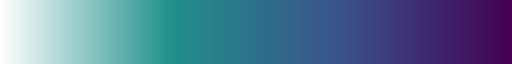

In [14]:
import matplotlib.colors as mcolors
line_colors = ['white', '#21908C', '#3B528B', '#440154']
cmapd = mcolors.LinearSegmentedColormap.from_list("custom_colormap", line_colors, N=256)
cmapd

In [15]:
dst = '2024-09-12'
edt = '2024-09-16'

daA = dsA['tp'].sel(time=slice(dst,edt)).sum('time')*86400
daM = dsM['tp'].sel(time=slice(dst,edt)).sum('time')*24000
daE = dsE['var228'].sel(time=slice(dst,edt)).sum('time')*24000
daO = dsO['precipitation'].sel(time=slice(dst,edt)).sum('time')

/home/a/a270229/.conda/envs/mypython/lib/python3.10/site-packages/cartopy/mpl/gridliner.py:475: UserWarning: The .ylabels_left attribute is deprecated. Please use .left_labels to toggle visibility instead.
  warnings.warn('The .ylabels_left attribute is deprecated. Please '
/home/a/a270229/.conda/envs/mypython/lib/python3.10/site-packages/cartopy/mpl/gridliner.py:463: UserWarning: The .xlabels_bottom attribute is deprecated. Please use .bottom_labels to toggle visibility instead.
  warnings.warn('The .xlabels_bottom attribute is deprecated. Please '
/home/a/a270229/.conda/envs/mypython/lib/python3.10/site-packages/cartopy/mpl/gridliner.py:475: UserWarning: The .ylabels_left attribute is deprecated. Please use .left_labels to toggle visibility instead.
  warnings.warn('The .ylabels_left attribute is deprecated. Please '
/home/a/a270229/.conda/envs/mypython/lib/python3.10/site-packages/cartopy/mpl/gridliner.py:463: UserWarning: The .xlabels_bottom attribute is deprecated. Please use .bot

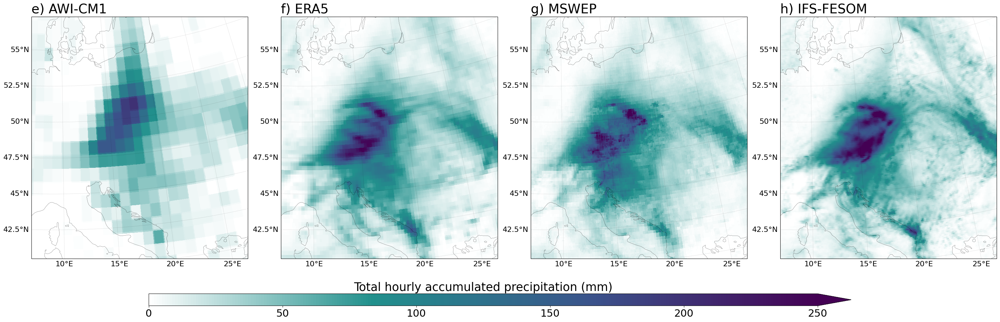

In [16]:
cmap = cmapd

data_list = [daA, daE, daO, daM]
vmax = 250
vmin = 0
# Custom options for each subplot
options_list = [

    {'title': 'AWI-CM1', 
     'vmin': vmin, 
     'vmax': vmax, 
     'clrmap': cmap, 'lbl': 'Total hourly accumulated precipitation (mm)',
     'panel_label': 'e) AWI-CM1'},
    
    {'title': 'ERA5', 
     'vmin': vmin, 
     'vmax': vmax, 
     'clrmap': cmap, 'lbl': 'mm',
     'panel_label': 'f) ERA5'},
   
     {'title': 'MSWEP', 
     'vmin': vmin, 
     'vmax': vmax, 
     'clrmap': cmap, 'lbl': 'mm',
     'panel_label': 'g) MSWEP'},

     {'title': 'IFS-FESOM', 
     'vmin': vmin, 
     'vmax': vmax, 
     'clrmap': cmap, 'lbl': 'Total accum. precipitation (mm)',
     'panel_label': 'h) IFS-FESOM'},

    
   ]

figtitle=''

fig, axs = plot_custom_maps(data_list, options_list, rows=1, cols=4, lbl_size=25, 
                           plot_type='pmesh', lat_start=40.5, lat_end=55, lon_start=7, lon_end=55,
                           fig_title=figtitle, mntpos=0.7, mntitle_size=20, triend='max', num_siz=28, num_Vpos=1.055, num_Hpos=0,
                           common_colorbar=True, cmcbpos=0.22, fsize=(30, 18), projection=ccrs.EuroPP())

# plt.savefig(f"{plotpath}F5_b.png", dpi=500, bbox_inches='tight')
plt.show()

---

48-hrs accumulated Precipitation 

---

***Cannot do this as no E-OBS hourly available***

---
---

Merged figure

---

In [17]:
from IPython.display import Image

In [18]:
Image(filename='/work/ab0995/a270229/work/data/paper1/story-nudged/plot/hires/REV_M4_events_2019HW_2024FLD_compasion_awicm1_era5_mswep_ifsfesom.png') #alias F5.png